## Introduction
In this notebook we trained the 3D Unet to segment primary lung tumors in CT scans

## Imports

* pathlib for easy path handling
* HTML for visualizing volume videos
* torchio for dataset creation
* torch for DataLoaders, optimizer and loss
* pytorch-lightning for training
* numpy for masking
* matplotlib for visualization
* Our 3D model

In [1]:
from pathlib import Path

import torchio as tio
import torch
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
import numpy as np

from model import UNet

## Dataset Creation
We can loop over all available scans and add them to the subject list

In [2]:
from pathlib import Path
import torchio as tio

# --- Base split root ---
BASE = Path(r"E:\DoNotTouch\projects\LANSCLC\CIS_5810\selected_150_split")

def change_img_to_label_path(p: Path) -> Path:
    """
    Map:
      .../image/Lung_xxx_0000.nii.gz  -->  .../label_gtvp/Lung_xxx.nii.gz
    """
    if p.parent.name != "image":
        raise ValueError(f"Expected parent folder named 'image', got: {p.parent}")
    label_dir = p.parent.with_name("label_gtvp")
    name = p.name
    if name.endswith("_0000.nii.gz"):
        name = name[:-len("_0000.nii.gz")] + ".nii.gz"
    else:
        name = name.replace("_0000", "")
        if not name.endswith(".nii.gz"):
            name += ".nii.gz"
    return label_dir / name

In [3]:
def build_subjects(split_dir: Path, require_label: bool = True):
    """
    Create TorchIO subjects from a split directory (train/val/test).
    If require_label=False, subjects without labels are still created (CT only).
    """
    image_paths = sorted(split_dir.rglob(r"image/Lung_*_0000.nii.gz"))
    subjects, missing = [], 0

    for img_path in image_paths:
        lab_path = change_img_to_label_path(img_path)
        if lab_path.exists():
            subjects.append(
                tio.Subject(
                    CT=tio.ScalarImage(img_path),
                    Label=tio.LabelMap(lab_path),
                )
            )
        else:
            missing += 1
            if require_label:
                print(f"[WARN] Missing label for: {img_path.name} -> {lab_path.name}")
                continue
            # Test-time without labels:
            subjects.append(tio.Subject(CT=tio.ScalarImage(img_path)))

    print(f"[{split_dir.name}] Built {len(subjects)} subjects (missing labels: {missing})")
    return subjects

# --- Build each split ---
train_subjects = build_subjects(BASE / "train", require_label=True)
val_subjects   = build_subjects(BASE / "val",   require_label=True)
test_subjects  = build_subjects(BASE / "test",  require_label=True)  # flip to True if you do have test labels

[train] Built 70 subjects (missing labels: 0)
[val] Built 40 subjects (missing labels: 0)
[test] Built 40 subjects (missing labels: 0)


In [4]:
for subject in train_subjects:
    assert subject["CT"].orientation == ("L", "P", "S")

We use the same  augmentation steps as used in the Dataset notebook. <br />
Regarding the processing, we use the **CropOrPad** functionality which crops or pads all images and masks to the same shape. <br />

We use ($256 \times 256 \times 200$)

In [5]:
import torch
import torchio as tio

# ---- top-level, picklable transforms ----
class ScaleCT3071_NoClamp(tio.transforms.IntensityTransform):
    """Divide CT intensities by 3071 in-place (keeps negatives and >1 values)."""
    def apply_transform(self, subject: tio.Subject) -> tio.Subject:
        if 'CT' in subject and isinstance(subject['CT'], tio.ScalarImage):
            data = subject['CT'].data
            if not torch.is_floating_point(data):
                data = data.float()
            subject['CT'].set_data(data / 3071.0)
        return subject

# (optional) if you need label binarization, keep this; otherwise remove
class RemapLabelToBinary(tio.transforms.Transform):
    def apply_transform(self, subject: tio.Subject) -> tio.Subject:
        if 'Label' in subject:
            lab = subject['Label'].data
            subject['Label'].set_data((lab > 0).to(torch.uint8))
        return subject

# ---- processing & augmentation ----
process = tio.Compose([
    tio.ToCanonical(),
    tio.Resample(target=(1.5, 1.5, 2.0)),
    tio.CropOrPad((256,256,200)),
    RemapLabelToBinary(),        # enable this
    ScaleCT3071_NoClamp(),
])

augmentation = tio.RandomAffine(scales=(0.9,1.1), degrees=(-10,10),
                                image_interpolation='linear',
                                label_interpolation='nearest')

val_transform = process
test_transform = process
train_transform = tio.Compose([process, augmentation])

Define the train and validation dataset. We use 70 subjects for training and 40 for validation. <br />
In order to help the segmentation network learn, we use the LabelSampler with p=0.2 for background, p=0.8 for lung tumors with a patch size of ($96 \times 96 \times 64$).

In [6]:
import random, numpy as np, torch, pytorch_lightning as pl

SEED = 1337
pl.seed_everything(SEED, workers=True)

# For strict reproducibility (slower but stable):
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# If you prefer speed after you’re satisfied with stability:
# torch.backends.cudnn.deterministic = False
# torch.backends.cudnn.benchmark = True

train_dataset = tio.SubjectsDataset(train_subjects, transform=train_transform)
val_dataset = tio.SubjectsDataset(val_subjects, transform=val_transform)
test_dataset = tio.SubjectsDataset(test_subjects, transform=test_transform)

train_sampler = tio.data.LabelSampler(patch_size=(96,96,64), label_name="Label",
                                      label_probabilities={0:0.2, 1:0.8})

# use unbiased patches for validation
val_sampler = tio.data.UniformSampler(patch_size=(96,96,64))

Seed set to 1337


Create the queue to draw patches from.<br />

In [7]:
train_patches_queue = tio.Queue(train_dataset, max_length=60, samples_per_volume=8,
                                sampler=train_sampler, num_workers=0)
val_patches_queue   = tio.Queue(val_dataset,   max_length=60, samples_per_volume=5,
                                sampler=val_sampler,   num_workers=0)

Define train and val loader.

In [8]:
from torch.utils.data import DataLoader

# -----------------------------------------
# 4) DataLoaders (your original settings)
# -----------------------------------------
use_amp = True
train_bs = 4 if use_amp else 2
val_bs   = min(8, 2 * train_bs)

train_loader = DataLoader(train_patches_queue, batch_size=train_bs, num_workers=0, pin_memory=True)
val_loader   = DataLoader(val_patches_queue,   batch_size=val_bs,   num_workers=0, pin_memory=True)

Finally we can create the Segmentation model.

We use the Adam optimizer with a learning rate of 1e-4 and a weighted cross-entropy loss, which assigns a threefold increased loss to tumorous voxels.

In [9]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import pytorch_lightning as pl
import torchio as tio

class SoftDiceLoss(nn.Module):
    def __init__(self, eps=1e-6):
        super().__init__()
        self.eps = eps
    def forward(self, logits, target):
        # logits, target: (B,1,H,W,D)
        prob = torch.sigmoid(logits)
        num  = 2 * (prob * target).sum(dim=(1,2,3,4)) + self.eps
        den  = (prob.pow(2) + target.pow(2)).sum(dim=(1,2,3,4)) + self.eps
        return 1.0 - (num / den).mean()

class Segmenter(pl.LightningModule):
    def __init__(
        self,
        model: nn.Module,         # e.g., UNet()
        lr: float = 1e-4,
        ce_weights=None,          # (w_bg, w_tumor) if model outputs 2 classes
        bce_pos_weight=None,      # e.g., 4.0 to upweight positives for 1-channel output
    ):
        super().__init__()
        self.save_hyperparameters(ignore=["model"])
        self.model = model
        self.lr = lr

        # Optional class weights as buffers (travel with device)
        self.register_buffer(
            "ce_weights_buf",
            torch.tensor(ce_weights, dtype=torch.float32) if ce_weights is not None else None
        )
        self.register_buffer(
            "bce_pos_weight_buf",
            torch.tensor([float(bce_pos_weight)], dtype=torch.float32) if bce_pos_weight is not None else None
        )
        self.soft_dice = SoftDiceLoss()

    def forward(self, x):
        return self.model(x)   # logits: (B,C,H,W,D) or (B,1,H,W,D)

    @staticmethod
    def _hard_dice_binary(pred_bin: torch.Tensor, gt_bin: torch.Tensor, eps: float = 1e-6) -> torch.Tensor:
        # pred_bin, gt_bin: (B,1,H,W,D) or (B,1,H,W)
        pred_bin = pred_bin.bool()
        gt_bin   = gt_bin.bool()
        reduce_dims = list(range(1, pred_bin.ndim))
        inter = (pred_bin & gt_bin).sum(dim=reduce_dims)
        denom = pred_bin.sum(dim=reduce_dims) + gt_bin.sum(dim=reduce_dims)
        return ((2 * inter + eps) / (denom + eps)).mean()

    def _shared_step(self, batch, stage: str):
        x = batch["CT"][tio.DATA]          # (B,1,H,W,D)
        y = batch["Label"][tio.DATA]       # (B,1,H,W,D), tumor > 0

        logits = self(x)                   # (B,C,H,W,D) or (B,1,H,W,D)
        C = logits.shape[1]

        if C == 1:
            # ----- Binary branch (BCE with logits) -----
            target = (y > 0).float()                         # (B,1,H,W,D)
            # Functional API lets us pass pos_weight easily
            bce = F.binary_cross_entropy_with_logits(
                logits, target, pos_weight=self.bce_pos_weight_buf
            )
            dsc = self.soft_dice(logits, target)
            loss = bce + dsc                      # <-- combined loss
            
            pred_bin = (torch.sigmoid(logits) > 0.5)         # (B,1,H,W,D)
            gt_bin   = (y > 0)
        else:
            # ----- Multiclass branch (CE; assume tumor is class 1) -----
            target = (y[:, 0] > 0).long()                    # (B,H,W,D)
            loss = F.cross_entropy(logits, target, weight=self.ce_weights_buf)
            pred_bin = (logits.argmax(dim=1, keepdim=True) == 1)  # (B,1,H,W,D)
            gt_bin   = (target == 1).unsqueeze(1)

        dice = self._hard_dice_binary(pred_bin, gt_bin)
        
        B = x.shape[0]

        # Log loss: training step & epoch; validation epoch
        self.log(f"{stage}_loss", loss,
                 on_step=(stage == "train"), on_epoch=True, prog_bar=True, batch_size=B)

        # Log dice: **train on_step + on_epoch** (so live curve shows), val on_epoch
        self.log(f"{stage}_dice", dice,
                 on_step=(stage == "train"), on_epoch=True, prog_bar=True, batch_size=B)

        return loss

    def training_step(self, batch, batch_idx):
        return self._shared_step(batch, "train")

    def validation_step(self, batch, batch_idx):
        self._shared_step(batch, "val")

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=self.lr)

In [10]:
# ---- Live per-patient Dice (training + validation) ----
import numpy as np
import torch
import torchio as tio
import matplotlib.pyplot as plt
from IPython.display import clear_output, display
import pytorch_lightning as pl

# ---------- full-volume prediction ----------
@torch.no_grad()
def predict_full_volume_tio(
    subject: tio.Subject,
    model: torch.nn.Module,
    device: torch.device,
    patch_size=(96, 96, 64),
    patch_overlap=(32, 32, 32),
    batch_size=2,
    num_workers=0,
    overlap_mode='average',   # or 'hann'
) -> torch.Tensor:
    """Return full-volume logits as [C, W, H, D] (CPU)."""
    model.eval()
    sampler = tio.inference.GridSampler(subject, patch_size=patch_size, patch_overlap=patch_overlap)
    aggregator = tio.inference.GridAggregator(sampler, overlap_mode=overlap_mode)
    loader = torch.utils.data.DataLoader(
        sampler, batch_size=batch_size, num_workers=num_workers,
        pin_memory=(device.type == 'cuda'), persistent_workers=(num_workers > 0)
    )
    for batch in loader:
        x   = batch['CT'][tio.DATA].to(device)      # [B,1,w,h,d]
        log = model(x)                               # [B,C,w,h,d]
        loc = batch[tio.LOCATION]
        aggregator.add_batch(log.detach().cpu(), loc)
    return aggregator.get_output_tensor()            # [C,W,H,D] (CPU)

def logits_to_binary_pred(logits_chwhd: torch.Tensor, tumor_idx=1, pos_thresh=0.5) -> np.ndarray:
    """[C,W,H,D] -> uint8 [W,H,D]"""
    C = logits_chwhd.shape[0]
    if C == 1:
        prob = torch.sigmoid(logits_chwhd[0])
        pred = (prob > pos_thresh)
    else:
        pred = (torch.argmax(logits_chwhd, dim=0) == tumor_idx)
    return pred.numpy().astype(np.uint8)

def subject_label_binary(subject: tio.Subject, tumor_positive_values=(1,)) -> np.ndarray:
    """TorchIO label -> uint8 [W,H,D]"""
    lab = subject['Label'][tio.DATA][0].detach().cpu().numpy()
    return np.isin(lab, tumor_positive_values).astype(np.uint8)

def dice_binary(y_true: np.ndarray, y_pred: np.ndarray, eps=1e-6, empty_ok_as=1.0) -> float:
    y_true = (y_true > 0).astype(np.uint8)
    y_pred = (y_pred > 0).astype(np.uint8)
    t, p = y_true.sum(), y_pred.sum()
    if t == 0 and p == 0:
        return float(empty_ok_as)
    inter = (y_true & y_pred).sum()
    return float((2 * inter + eps) / (t + p + eps))

def get_subject_id(subj: tio.Subject, fallback_prefix="case"):
    """
    Prefer CT filename; strip '_0000' so 'Lung_123_0000.nii.gz' -> 'Lung_123'.
    Falls back to subject['subject_id'] or a generic name.
    """
    try:
        p = Path(subj['CT'].path)
        stem = p.stem  # e.g., Lung_123_0000
        return stem.replace('_0000', '')
    except Exception:
        sid = subj.get('subject_id', None)
        return str(sid) if sid is not None else fallback_prefix

In [11]:
# --- callbacks.py (or inline in your notebook) ---
import matplotlib.pyplot as plt
from IPython.display import display
import pytorch_lightning as pl

class LiveEpochCurves(pl.Callback):
    """Live plots of train/val loss & dice, all indexed by epoch."""
    def __init__(self, title: str = "Learning Curves (per-epoch)"):
        super().__init__()
        self.title = title
        self.train_epochs, self.train_loss, self.train_dice = [], [], []
        self.val_epochs,   self.val_loss,   self.val_dice   = [], [], []
        self.fig = self.ax_loss = self.ax_dice = self.disp = None

    @staticmethod
    def _pick(metrics, substrings):
        ssubs = [s.lower() for s in substrings]
        for k, v in metrics.items():
            kl = k.lower()
            if all(s in kl for s in ssubs):
                try:
                    return float(v)
                except Exception:
                    pass
        return None

    def _draw(self):
        if self.fig is None:
            return
        self.ax_loss.clear(); self.ax_dice.clear()

        # Loss
        if self.train_epochs:
            self.ax_loss.plot(self.train_epochs, self.train_loss, label="train_loss")
        if self.val_epochs:
            self.ax_loss.plot(self.val_epochs, self.val_loss, "o-", label="val_loss")
        self.ax_loss.set_xlabel("epoch"); self.ax_loss.set_ylabel("loss")
        self.ax_loss.grid(alpha=.3); self.ax_loss.legend(loc="best")

        # Dice
        if self.train_epochs:
            self.ax_dice.plot(self.train_epochs, self.train_dice, label="train_dice")
        if self.val_epochs:
            self.ax_dice.plot(self.val_epochs, self.val_dice, "o-", label="val_dice")
        self.ax_dice.set_xlabel("epoch"); self.ax_dice.set_ylabel("dice"); self.ax_dice.set_ylim(0, 1)
        self.ax_dice.grid(alpha=.3); self.ax_dice.legend(loc="best")

        self.fig.suptitle(self.title)
        self.fig.tight_layout()
        
#         clear_output(wait=True)
#         display(self.fig)
        
        # Force a redraw in notebooks
        self.fig.canvas.draw()
        self.fig.canvas.flush_events()
        
        if self.disp is not None:
            self.disp.update(self.fig)

    def on_fit_start(self, trainer, pl_module):
        import matplotlib
        matplotlib.pyplot.ion()  # interactive mode
        self.fig, (self.ax_loss, self.ax_dice) = plt.subplots(1, 2, figsize=(11,4))
        from IPython.display import display
        self.disp = display(self.fig, display_id=True)

    def on_train_epoch_end(self, trainer, pl_module):
        m = trainer.callback_metrics
        e = trainer.current_epoch
        tr_loss = self._pick(m, ["train", "loss"])
        tr_dice = self._pick(m, ["train", "dice"])
        wrote = False
        if tr_loss is not None:
            self.train_epochs.append(e); self.train_loss.append(tr_loss); wrote = True
        if tr_dice is not None:
            if not wrote:
                self.train_epochs.append(e)
            self.train_dice.append(tr_dice)
        self._draw()

    def on_validation_epoch_end(self, trainer, pl_module):
        m = trainer.callback_metrics
        e = trainer.current_epoch
        va_loss = self._pick(m, ["val", "loss"])
        va_dice = self._pick(m, ["val", "dice"])
        wrote = False
        if va_loss is not None:
            self.val_epochs.append(e); self.val_loss.append(va_loss); wrote = True
        if va_dice is not None:
            if not wrote:
                self.val_epochs.append(e)
            self.val_dice.append(va_dice)
        self._draw()

    def on_fit_end(self, trainer, pl_module):
        self._draw()


In [12]:
# For 2-class softmax head
#ce_weights = torch.tensor([1.0, 4.0], dtype=torch.float32)  # [bg, tumor] — tune as needed

model = Segmenter(
    model=UNet(),          # with self.layer8 = Conv3d(32, 2, 1)
    lr=1e-4,
    ce_weights=None, # enables weighted CrossEntropy in your Segmenter
    bce_pos_weight=None    # must be None for softmax/CE path
)

In [13]:
import torch
import pytorch_lightning as pl
from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping

# IMPORTANT: your Segmenter must log exactly these keys at epoch end:
# self.log("train_loss", ..., on_step=False, on_epoch=True)
# self.log("train_dice", ..., on_step=False, on_epoch=True)
# self.log("val_loss",   ..., on_step=False, on_epoch=True)
# self.log("val_dice",   ..., on_step=False, on_epoch=True)

# Save best by validation loss
ckpt_loss = ModelCheckpoint(
    dirpath="ckpts/loss",
    filename="loss-{epoch:03d}-{val_loss:.4f}",
    monitor="val_loss",
    mode="min",
    save_top_k=5,
    save_last=True,
)

# Also save best by validation Dice
ckpt_dice = ModelCheckpoint(
    dirpath="ckpts/dice",
    filename="dice-{epoch:03d}-{val_dice:.4f}",
    monitor="val_dice",
    mode="max",
    save_top_k=3,
)

# Stop early on plateau (val_loss)
# early_stop = EarlyStopping(monitor="val_loss", mode="min", patience=15, min_delta=1e-4)

In [14]:
# Live curves
curve_cb = LiveEpochCurves(title="3D U-Net — Loss & Dice (per epoch)")

logger = TensorBoardLogger(save_dir="./logs")

use_gpu = torch.cuda.is_available()

# --- progress bar: use TQDM in notebooks ---
try:
    from pytorch_lightning.callbacks import TQDMProgressBar
except Exception:
    from lightning.pytorch.callbacks import TQDMProgressBar

progress_cb = TQDMProgressBar(refresh_rate=1)  # update every step


trainer = pl.Trainer(
    accelerator="gpu" if use_gpu else "cpu",
    devices=1 if use_gpu else None,
    logger=logger,
    callbacks=[ckpt_loss, ckpt_dice, progress_cb, curve_cb],  # include progress_cb
    enable_progress_bar=True,   # <- force on
    log_every_n_steps=1,
    max_epochs=100,
    precision=16 if use_gpu else 32,
    num_sanity_val_steps=0,
    check_val_every_n_epoch=1,
)

C:\ProgramData\Anaconda3\envs\py38\lib\site-packages\lightning_fabric\connector.py:571: `precision=16` is supported for historical reasons but its usage is discouraged. Please set your precision to 16-mixed instead!
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


C:\ProgramData\Anaconda3\envs\py38\lib\site-packages\pytorch_lightning\callbacks\model_checkpoint.py:654: Checkpoint directory E:\DoNotTouch\projects\LANSCLC\CIS_5810\3D U-Net\ckpts\loss exists and is not empty.
C:\ProgramData\Anaconda3\envs\py38\lib\site-packages\pytorch_lightning\callbacks\model_checkpoint.py:654: Checkpoint directory E:\DoNotTouch\projects\LANSCLC\CIS_5810\3D U-Net\ckpts\dice exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


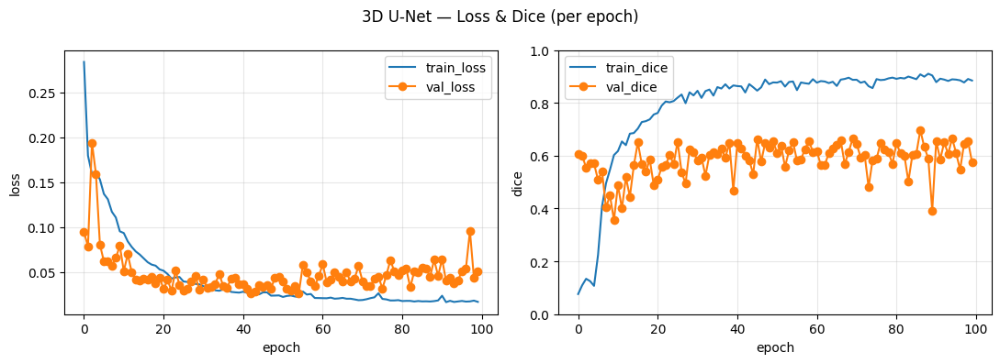


  | Name      | Type         | Params | Mode 
---------------------------------------------------
0 | model     | UNet         | 5.8 M  | train
1 | soft_dice | SoftDiceLoss | 0      | train
---------------------------------------------------
5.8 M     Trainable params
0         Non-trainable params
5.8 M     Total params
23.344    Total estimated model params size (MB)
46        Modules in train mode
0         Modules in eval mode
C:\ProgramData\Anaconda3\envs\py38\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.
C:\ProgramData\Anaconda3\envs\py38\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` 

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

`Trainer.fit` stopped: `max_epochs=100` reached.


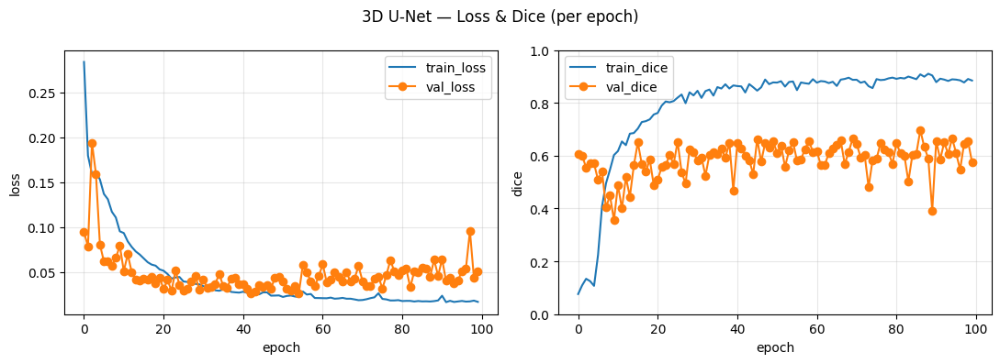

In [15]:
# Train the model.
# This might take some hours depending on your GPU
trainer.fit(model, train_loader, val_loader)

## Evaluation

In [26]:
from IPython.display import HTML
from celluloid import Camera

First we load the model and place it on the gpu if possible

In [27]:
# After trainer.fit(...)
best_loss_ckpt = ckpt_loss.best_model_path     # monitored by "val_loss"
best_dice_ckpt = ckpt_dice.best_model_path     # monitored by "val_dice"

print("Best-by-loss :", best_loss_ckpt)
print("Best-by-dice :", best_dice_ckpt)

# Sensible default: prefer best Dice, otherwise fall back to best loss (or last)
best_ckpt = best_dice_ckpt or best_loss_ckpt or ckpt_loss.last_model_path
print("Chosen best  :", best_ckpt)

Best-by-loss : E:\DoNotTouch\projects\LANSCLC\CIS_5810\3D U-Net\ckpts\loss\loss-epoch=042-val_loss=0.0259.ckpt
Best-by-dice : E:\DoNotTouch\projects\LANSCLC\CIS_5810\3D U-Net\ckpts\dice\dice-epoch=086-val_dice=0.6968.ckpt
Chosen best  : E:\DoNotTouch\projects\LANSCLC\CIS_5810\3D U-Net\ckpts\dice\dice-epoch=086-val_dice=0.6968.ckpt


In [28]:
#from pathlib import Path
#best_ckpt = Path(r"E:\DoNotTouch\projects\LANSCLC\CIS_5810\3D U-Net\ckpts\dice\dice-epoch=060-val_dice=0.6222.ckpt")
model = Segmenter.load_from_checkpoint(best_ckpt, model=UNet())

In [29]:
model = model.eval()
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model.to(device);

### Patch Aggregation
The model was trained in a patch wise manner as the full volumes are too large to be placed on a typical GPU.
But we still want to get a result for the whole volume.<br />
We performed *Patch Aggregation* by using torchio.

The goal of patch aggregation is to split the image into patches, then compute the segmentation for each patch and finally merge the predictions into the prediction for the full volume.

The pipeline we performed is as follows:
1. Define the **GridSampler(subject, patch_size, patch_overlap)** responsible for dividing the volume into patches. Each patch is defined by its location accesible via *tio.LOCATION*
2. Define the **GridAggregator(grid_sampler)** which merges the predicted patches back together
3. Compute the prediction on the patches and aggregate them via **aggregator.add_batch(pred, location)**
4. Extract the full prediction via **aggregator.get_output_tensor()**

Additionally, we leveraged the DataLoader from pytorch to perform the prediction in a batch wise manner for a nice speed up

In [30]:
# Select a validation subject and extract the images and segmentation for evaluation
IDX = 12
mask = val_dataset[IDX]["Label"]["data"]
imgs = val_dataset[IDX]["CT"]["data"]

# GridSampler
grid_sampler = tio.inference.GridSampler(val_dataset[IDX], (96,96,64), (32, 32, 32))

In [31]:
# GridAggregator
aggregator = tio.inference.GridAggregator(grid_sampler)

In [32]:
# DataLoader for speed up
patch_loader = torch.utils.data.DataLoader(grid_sampler, batch_size=4)

In [33]:
# Prediction
with torch.no_grad():
    for patches_batch in patch_loader:
        input_tensor = patches_batch['CT']["data"].to(device)  # Get batch of patches
        locations = patches_batch[tio.LOCATION]  # Get locations of patches
        pred = model(input_tensor)  # Compute prediction
        aggregator.add_batch(pred, locations)  # Combine predictions to volume

In [34]:
# Extract the volume prediction
output_tensor = aggregator.get_output_tensor()  

Finally we can visualize the prediction as usual

In [43]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display

# -------- helpers --------
def to_np(x):
    return x.detach().cpu().numpy() if hasattr(x, "detach") else np.asarray(x)

def reorient_2d(a):
    return np.rot90(np.flipud(a), k=3)   # keep unchanged

def rot180(a):
    return np.rot90(a, k=2)              # extra -180° rotation

def flip_tb(a):
    return np.flipud(a)                  # top–bottom flip (after your existing ops)

def make_depth_slicer(vol, D):
    a = to_np(vol)
    if a.ndim == 5:  # [B,C,H,W,D] or [B,C,D,H,W]
        b = a[0]
        if b.shape[-1] == D:   return lambda i: np.squeeze(b[0, :, :, i])     # [C,H,W,D]
        if b.shape[1]  == D:   return lambda i: np.squeeze(b[0, i, :, :])     # [C,D,H,W]
    elif a.ndim == 4:  # [B,H,W,D] or [B,D,H,W]
        b = a[0]
        if b.shape[-1] == D:   return lambda i: np.squeeze(b[:, :, i])
        if b.shape[0]  == D:   return lambda i: np.squeeze(b[i, :, :])
    elif a.ndim == 3:  # [H,W,D] or [D,H,W]
        if a.shape[-1] == D:   return lambda i: np.squeeze(a[:, :, i])
        if a.shape[0]  == D:   return lambda i: np.squeeze(a[i, :, :])
    raise ValueError(f"Can't determine depth axis for shape {a.shape} with D={D}")

def window_ct_hu(img, wl=-600, ww=1500):
    lo, hi = wl - ww/2, wl + ww/2
    x = np.nan_to_num(img.astype(np.float32), nan=lo)
    x = np.clip(x, lo, hi)
    return (x - lo) / (hi - lo + 1e-6)

def normalize_for_display(img):
    x = np.nan_to_num(img.astype(np.float32), nan=0.0)
    vmin, vmax = np.percentile(x, [1, 99])
    looks_like_hu = (x.min() < -500) or (x.max() > 200) or (vmax - vmin > 800)
    return window_ct_hu(x) if looks_like_hu else (
        np.zeros_like(x)+0.5 if vmax - vmin < 1e-6
        else (np.clip(x, vmin, vmax) - vmin) / (vmax - vmin + 1e-6)
    )

# -------- data prep --------
pred_np = to_np(output_tensor.argmax(0))          # [H,W,D]  (use this for 2-class softmax)
# pred_np = (to_np(output_tensor[0]) > 0).astype(np.uint8)  # <-- if 1-channel sigmoid

D = pred_np.shape[-1]
get_img = make_depth_slicer(imgs, D)
get_gt  = make_depth_slicer(mask, D) if ('mask' in globals() and mask is not None) else None

# -------- figure & artists --------
fig, ax = plt.subplots()
ax.set_axis_off()

# initial (slice 0) — apply (-180°) then flip TB, keeping origin="lower"
ct0 = flip_tb(rot180(reorient_2d(normalize_for_display(get_img(0)))))
im_ct = ax.imshow(ct0, cmap="bone", vmin=0, vmax=1, zorder=0, origin="lower")

p0 = flip_tb(rot180(reorient_2d(pred_np[:, :, 0])))
im_pred = ax.imshow(np.ma.masked_where(p0 <= 0, p0.astype(float)),
                    alpha=0.35, cmap="autumn", interpolation="nearest",
                    zorder=3, origin="lower")

im_gt = None
if get_gt is not None:
    gt0 = flip_tb(rot180(reorient_2d(get_gt(0))))
    im_gt = ax.imshow(np.ma.masked_where(gt0 <= 0, gt0.astype(float)),
                      alpha=0.35, cmap="winter", interpolation="nearest",
                      zorder=2, origin="lower")

def update(i):
    # base CT
    ct = flip_tb(rot180(reorient_2d(normalize_for_display(get_img(i)))))
    im_ct.set_data(ct)

    # prediction
    p = flip_tb(rot180(reorient_2d(pred_np[:, :, i])))
    im_pred.set_data(np.ma.masked_where(p <= 0, p.astype(float)))

    # GT
    if im_gt is not None:
        gt = flip_tb(rot180(reorient_2d(get_gt(i))))
        im_gt.set_data(np.ma.masked_where(gt <= 0, gt.astype(float)))

    return tuple([x for x in (im_ct, im_pred, im_gt) if x is not None])

def init():
    return update(0)

ani = FuncAnimation(fig,
                    update,
                    frames=range(1, D, 2),   # start at 1 to avoid duplicate first frame
                    init_func=init,
                    interval=60,
                    blit=False,
                    repeat=False)

html = ani.to_jshtml()
plt.close(fig)
display(HTML(html))

In [45]:
from typing import Optional, List, Tuple

# ---------- Per-split evaluation (returns subject_ids) ----------
@torch.no_grad()
def evaluate_split_dice(
    dataset: tio.SubjectsDataset,
    model: torch.nn.Module,
    device: Optional[torch.device] = None,
    patch_size=(96, 96, 64),
    patch_overlap=(32, 32, 32),
    batch_size=2,
    num_workers=0,
    tumor_idx=1,
    pos_thresh=0.5,
    tumor_positive_values=(1,),
    overlap_mode='average',
    postprocess_lcc: bool = False,
    verbose: bool = True,
) -> Tuple[float, List[float], List[str]]:
    """
    Iterates subjects in `dataset`, predicts full volume, computes per-subject Dice.
    Returns (mean_dice, per_subject_dice_list, subject_ids).

    Assumes `predict_full_volume_tio` returns logits with shape [C, W, H, D].
    """
    dices: List[float] = []
    subject_ids: List[str] = []
    model = model.eval()
    if device is None:
        device = getattr(model, 'device', None) or next(model.parameters()).device

    for i in range(len(dataset)):
        subject = dataset[i]

        # Prefer an ID derived from the filename (fallback to index)
        sid = get_case_id_from_subject(subject) if 'CT' in subject else subject.get('subject_id', f'case_{i}')
        subject_ids.append(sid)

        # Predict full-volume logits (shape [C, W, H, D])
        logits_full = predict_full_volume_tio(
            subject, model, device=device,
            patch_size=patch_size, patch_overlap=patch_overlap,
            batch_size=batch_size, num_workers=num_workers,
            overlap_mode=overlap_mode,
        )

        # Binarize prediction & GT -> shape [W, H, D]
        pred_bin = logits_to_binary_pred(logits_full, tumor_idx=tumor_idx, pos_thresh=pos_thresh)
        if postprocess_lcc:
            pred_bin = largest_component(pred_bin)  # ensure this function exists
        gt_bin   = subject_label_to_binary(subject, tumor_positive_values=tumor_positive_values)

        # Dice
        d = dice_binary(gt_bin, pred_bin)
        dices.append(d)

        if verbose:
            print(f"[{sid}] Dice: {d:.4f}")

    mean_dice = float(np.mean(dices)) if dices else 0.0
    if verbose:
        print(f"\nMean Dice over {len(dices)} subjects: {mean_dice:.4f}")
    return mean_dice, dices, subject_ids

def logits_to_binary_pred(logits_chwhd: torch.Tensor, tumor_idx=1, pos_thresh=0.5) -> np.ndarray:
    C = logits_chwhd.shape[0]
    if C == 1:
        prob = torch.sigmoid(logits_chwhd[0])
        pred = (prob > pos_thresh)
    else:
        prob = F.softmax(logits_chwhd, dim=0)[tumor_idx]
        pred = (prob > pos_thresh)
    return pred.numpy().astype(np.uint8)

def largest_component(mask: np.ndarray) -> np.ndarray:
    import scipy.ndimage as ndi
    if mask.sum() == 0:
        return mask
    lab, n = ndi.label(mask.astype(np.uint8))
    if n == 0:
        return mask
    sizes = np.bincount(lab.ravel())
    sizes[0] = 0
    keep = sizes.argmax()
    return (lab == keep).astype(mask.dtype)

# ---------- Pretty printer for split results ----------
def print_split_report(subject_ids: List[str], dices: List[float], title: str = "Split"):
    assert len(subject_ids) == len(dices)
    print(f"\n=== {title} Dice Report ===")
    for sid, d in zip(subject_ids, dices):
        print(f"[{sid}] Dice: {d:.4f}")
    dices_np = np.asarray(dices, dtype=float)
    print(f"\n{title} summary:")
    print(f"  Mean : {dices_np.mean():.4f}")
    print(f"  Median: {np.median(dices_np):.4f}")
    print(f"  Std  : {dices_np.std(ddof=0):.4f}")
    print(f"  Min  : {dices_np.min():.4f}")
    print(f"  Max  : {dices_np.max():.4f}")

In [50]:
import re
from pathlib import Path
from typing import Optional, List, Tuple

import numpy as np
import torch
import torch.nn.functional as F
import torchio as tio

# -------------------------------
# Case-ID helpers
# -------------------------------
def _extract_case_id_from_name(name: str) -> str:
    """
    Accepts:
      - Lung_003_0000.nii.gz  -> '003'
      - Lung_003.nii.gz       -> '003'
    Falls back to the stem if pattern isn't found.
    """
    m = re.match(r"^Lung_([^_]+)_0000\.nii(\.gz)?$", name, flags=re.IGNORECASE)
    if m:
        return m.group(1)
    m = re.match(r"^Lung_([^_]+)\.nii(\.gz)?$", name, flags=re.IGNORECASE)
    if m:
        return m.group(1)
    return re.sub(r"\.nii(\.gz)?$", "", name, flags=re.IGNORECASE)

def get_case_id_from_subject(subject: tio.Subject) -> str:
    """
    Prefer CT path; if missing, try Label path. Returns a concise ID (e.g., '003').
    """
    ct_path = None
    if 'CT' in subject:
        try:
            ct_path = Path(subject['CT'][tio.PATH])
        except Exception:
            ct_path = Path(getattr(subject['CT'], "path", "")) if hasattr(subject['CT'], "path") else None

    if ct_path is None or not str(ct_path):
        lab_path = None
        if 'Label' in subject:
            try:
                lab_path = Path(subject['Label'][tio.PATH])
            except Exception:
                lab_path = Path(getattr(subject['Label'], "path", "")) if hasattr(subject['Label'], "path") else None
        if lab_path is not None and str(lab_path):
            return _extract_case_id_from_name(lab_path.name)

    if ct_path is not None and str(ct_path):
        return _extract_case_id_from_name(ct_path.name)

    return str(subject.get('subject_id', 'unknown'))

# -------------------------------
# I/O helpers
# -------------------------------
@torch.no_grad()
def predict_full_volume_tio(
    subject: tio.Subject,
    model: torch.nn.Module,
    device: Optional[torch.device] = None,
    patch_size=(96, 96, 64),
    patch_overlap=(32, 32, 32),
    batch_size=2,
    num_workers=0,
    overlap_mode='average',
) -> torch.Tensor:
    """
    Sliding-window inference with TorchIO GridSampler/Aggregator.
    Returns logits tensor [C, W, H, D].
    """
    model.eval()
    if device is None:
        device = getattr(model, 'device', None) or next(model.parameters()).device

    sampler = tio.inference.GridSampler(subject, patch_size=patch_size, patch_overlap=patch_overlap)
    aggregator = tio.inference.GridAggregator(sampler, overlap_mode=overlap_mode)

    loader = torch.utils.data.DataLoader(
        sampler,
        batch_size=batch_size,
        num_workers=num_workers,
        pin_memory=(device.type == 'cuda'),
        persistent_workers=(num_workers > 0),
    )

    for batch in loader:
        x = batch['CT'][tio.DATA].to(device)   # [B,1,w,h,d]
        logits = model(x)                      # [B,C,w,h,d]
        aggregator.add_batch(logits.detach().cpu(), batch[tio.LOCATION])

    return aggregator.get_output_tensor()      # [C,W,H,D]

def logits_to_binary_pred(
    logits_chwhd: torch.Tensor, tumor_idx: int = 1, pos_thresh: float = 0.5
) -> np.ndarray:
    """
    Binarize logits [C, W, H, D] -> uint8 mask [W,H,D].
    Supports either 1-channel (sigmoid) or multi-class (softmax) logits.
    """
    C = logits_chwhd.shape[0]
    if C == 1:
        prob = torch.sigmoid(logits_chwhd[0])
        pred = (prob > pos_thresh)
    else:
        prob_tumor = F.softmax(logits_chwhd, dim=0)[tumor_idx]
        pred = (prob_tumor > pos_thresh)
    return pred.numpy().astype(np.uint8)

def subject_label_to_binary(subject: tio.Subject, tumor_positive_values=(1,)) -> np.ndarray:
    lab = subject['Label'][tio.DATA]      # [1,W,H,D]
    lab = lab[0].detach().cpu().numpy()   # [W,H,D] ints
    return np.isin(lab, tumor_positive_values).astype(np.uint8)

def dice_binary(y_true: np.ndarray, y_pred: np.ndarray, eps: float = 1e-6, empty_ok_as: float = 1.0) -> float:
    """
    Sørensen–Dice for binary masks. If both are empty, returns empty_ok_as (default 1.0).
    """
    y_true = (y_true > 0).astype(np.uint8)
    y_pred = (y_pred > 0).astype(np.uint8)
    t_sum, p_sum = y_true.sum(), y_pred.sum()
    if t_sum == 0 and p_sum == 0:
        return float(empty_ok_as)
    inter = (y_true & y_pred).sum()
    return float((2.0 * inter + eps) / (t_sum + p_sum + eps))

def largest_component(mask: np.ndarray) -> np.ndarray:
    """
    Keep only the largest connected component (3D). No-op if mask is empty.
    """
    import scipy.ndimage as ndi
    if mask.sum() == 0:
        return mask
    lab, n = ndi.label(mask.astype(np.uint8))
    if n == 0:
        return mask
    sizes = np.bincount(lab.ravel())
    sizes[0] = 0
    keep = sizes.argmax()
    return (lab == keep).astype(mask.dtype)

# -------------------------------
# Evaluation: volumetric + patch-wise
# -------------------------------
@torch.no_grad()
def evaluate_split_dice_and_patchwise(
    dataset: tio.SubjectsDataset,
    model: torch.nn.Module,
    device: Optional[torch.device] = None,
    patch_size=(96, 96, 64),
    patch_overlap=(32, 32, 32),
    batch_size=2,
    num_workers=0,
    tumor_idx=1,
    pos_thresh=0.5,
    tumor_positive_values=(1,),
    overlap_mode='average',
    postprocess_lcc: bool = False,
    print_per_case: bool = True,
    empty_ok_as: float = 1.0,   # score for (empty, empty) patches
) -> Tuple[
    float, List[float], List[str],    # volumetric mean, per-case volumetric dice, case ids
    float, List[float], int           # patch micro-mean, per-case patch means, total #patches
]:
    """
    Computes BOTH:
      • Volumetric Dice (per subject) via aggregation.
      • Patch-wise Dice on raw sampler patches (micro-average across all patches).
    """
    if device is None:
        device = getattr(model, 'device', None) or next(model.parameters()).device
    model.eval()

    vol_dices: List[float] = []
    case_ids: List[str] = []

    patch_means_per_case: List[float] = []
    patch_dices_all: List[float] = []
    n_patches_total: int = 0

    for i in range(len(dataset)):
        subject = dataset[i]
        case_id = get_case_id_from_subject(subject)
        case_ids.append(case_id)

        # Sampler/aggregator for volumetric inference
        sampler = tio.inference.GridSampler(subject, patch_size=patch_size, patch_overlap=patch_overlap)
        aggregator = tio.inference.GridAggregator(sampler, overlap_mode=overlap_mode)

        loader = torch.utils.data.DataLoader(
            sampler,
            batch_size=batch_size,
            num_workers=num_workers,
            pin_memory=(device.type == 'cuda'),
            persistent_workers=(num_workers > 0),
        )

        # Collect patch-wise Dice for this case
        patch_dices_case: List[float] = []

        for batch in loader:
            x = batch['CT'][tio.DATA].to(device)   # [B,1,w,h,d]
            logits = model(x)                      # [B,C,w,h,d]
            aggregator.add_batch(logits.detach().cpu(), batch[tio.LOCATION])

            # ---- Patch-wise Dice computation ----
            gt_patches = batch['Label'][tio.DATA]  # [B,1,w,h,d] (already cropped)
            B = logits.shape[0]
            for b in range(B):
                logit_b = logits[b].detach().cpu()          # [C,w,h,d]
                gt_b    = gt_patches[b, 0].detach().cpu().numpy()  # [w,h,d]
                gt_bin  = np.isin(gt_b, tumor_positive_values).astype(np.uint8)

                if logit_b.shape[0] == 1:
                    prob = torch.sigmoid(logit_b[0])
                    pred_bin = (prob > pos_thresh).numpy().astype(np.uint8)
                else:
                    prob_tumor = F.softmax(logit_b, dim=0)[tumor_idx]
                    pred_bin = (prob_tumor > pos_thresh).numpy().astype(np.uint8)

                d_patch = dice_binary(gt_bin, pred_bin, empty_ok_as=empty_ok_as)
                patch_dices_case.append(float(d_patch))

        # ---- Volumetric Dice (reconstructed full volume) ----
        logits_full = aggregator.get_output_tensor()  # [C,W,H,D]
        pred_bin_full = logits_to_binary_pred(logits_full, tumor_idx=tumor_idx, pos_thresh=pos_thresh)
        if postprocess_lcc:
            pred_bin_full = largest_component(pred_bin_full)
        gt_bin_full = subject_label_to_binary(subject, tumor_positive_values=tumor_positive_values)

        d_vol = dice_binary(gt_bin_full, pred_bin_full)
        vol_dices.append(d_vol)

        # Aggregate per-case patch stats
        if patch_dices_case:
            case_patch_mean = float(np.mean(patch_dices_case))
            patch_means_per_case.append(case_patch_mean)
            patch_dices_all.extend(patch_dices_case)
            n_patches_total += len(patch_dices_case)
        else:
            patch_means_per_case.append(float('nan'))

        if print_per_case:
            if np.isfinite(patch_means_per_case[-1]):
                print(f"[case {case_id}] Vol Dice: {d_vol:.4f} | Patch mean: {case_patch_mean:.4f} (n={len(patch_dices_case)})")
            else:
                print(f"[case {case_id}] Vol Dice: {d_vol:.4f} | Patch mean: n/a")

    vol_mean = float(np.mean(vol_dices)) if vol_dices else 0.0
    patch_micro_mean = float(np.mean(patch_dices_all)) if patch_dices_all else 0.0

    if print_per_case:
        print(f"\nVolumetric Dice — mean over {len(vol_dices)} cases: {vol_mean:.4f}")
        print(f"Patch-wise Dice — micro-mean over {n_patches_total} patches: {patch_micro_mean:.4f}")

    return vol_mean, vol_dices, case_ids, patch_micro_mean, patch_means_per_case, n_patches_total

# -------------------------------
# Reporting helper
# -------------------------------
def print_split_report_both(
    case_ids: List[str],
    vol_dices: List[float],
    patch_means_per_case: List[float],
    patch_micro_mean: float,
    n_patches_total: int,
    title: str = "Split"
):
    vol_np = np.asarray(vol_dices, dtype=float)
    patch_case_np = np.asarray(patch_means_per_case, dtype=float)

    print(f"\n=== {title} Dice Report ===")
    for sid, dv, dp in zip(case_ids, vol_np, patch_case_np):
        if np.isnan(dp):
            print(f"[{sid}] Vol: {dv:.4f} | Patch mean: n/a")
        else:
            print(f"[{sid}] Vol: {dv:.4f} | Patch mean: {dp:.4f}")

    print(f"\n{title} summary:")
    print(f"  Volumetric Dice (per-case): mean {vol_np.mean():.4f} | median {np.median(vol_np):.4f} | std {vol_np.std(ddof=0):.4f}")
    if np.isfinite(patch_case_np).any():
        finite = patch_case_np[np.isfinite(patch_case_np)]
        print(f"  Patch Dice (per-case mean): mean {finite.mean():.4f} | median {np.median(finite):.4f} | std {finite.std(ddof=0):.4f}")
    print(f"  Patch Dice (micro across all patches): {patch_micro_mean:.4f} (n={n_patches_total})")

# -------------------------------
# Example usage
# -------------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device).eval()
common = dict(
    patch_size=(96,96,64),
    patch_overlap=(32,32,32),
    batch_size=2,
    num_workers=0,
    overlap_mode='average',
    tumor_idx=1,
    pos_thresh=0.5,
    tumor_positive_values=(1,),
    print_per_case=True,
)
print("\nValidation split:")
vol_m_v, vol_v, ids_v, p_micro_v, p_case_v, n_p_v = evaluate_split_dice_and_patchwise(val_dataset, model, device=device, **common)
# print_split_report_both(ids_v, vol_v, p_case_v, p_micro_v, n_p_v, title="Validation")

print("\nTest split:")
vol_m_t, vol_t, ids_t, p_micro_t, p_case_t, n_p_t = evaluate_split_dice_and_patchwise(test_dataset, model, device=device, **common)
# print_split_report_both(ids_t, vol_t, p_case_t, p_micro_t, n_p_t, title="Test")


Validation split:
[case 036] Vol Dice: 0.3632 | Patch mean: 0.7493 (n=96)
[case 054] Vol Dice: 0.7860 | Patch mean: 0.8144 (n=96)
[case 056] Vol Dice: 0.4703 | Patch mean: 0.7043 (n=96)
[case 085] Vol Dice: 0.1583 | Patch mean: 0.6952 (n=96)
[case 103] Vol Dice: 0.8325 | Patch mean: 0.8283 (n=96)
[case 117] Vol Dice: 0.4471 | Patch mean: 0.6920 (n=96)
[case 136] Vol Dice: 0.4922 | Patch mean: 0.6517 (n=96)
[case 152] Vol Dice: 0.8281 | Patch mean: 0.8365 (n=96)
[case 161] Vol Dice: 0.7722 | Patch mean: 0.8869 (n=96)
[case 162] Vol Dice: 0.6144 | Patch mean: 0.8188 (n=96)
[case 191] Vol Dice: 0.0096 | Patch mean: 0.6902 (n=96)
[case 224] Vol Dice: 0.7993 | Patch mean: 0.7602 (n=96)
[case 247] Vol Dice: 0.7509 | Patch mean: 0.8447 (n=96)
[case 251] Vol Dice: 0.8583 | Patch mean: 0.6798 (n=96)
[case 317] Vol Dice: 0.0140 | Patch mean: 0.8059 (n=96)
[case 372] Vol Dice: 0.2650 | Patch mean: 0.7791 (n=96)
[case 406] Vol Dice: 0.6532 | Patch mean: 0.8229 (n=96)
[case 432] Vol Dice: 0.8048 |

In [ ]:
# ==== imports ====
import numpy as np, torch, torch.nn.functional as F, matplotlib.pyplot as plt
import torchio as tio

# -------- pick one processed validation subject --------
subj   = val_dataset[0]                           # or any index
device = next(model.parameters()).device

# -------- full-volume logits on processed grid (C=2 expected) --------
# result shape: [C, W, H, D] (CPU)
logits_cwhd = predict_full_volume_tio(
    subject=subj, model=model, device=device,
    patch_size=(96,96,64), patch_overlap=(32,32,32), batch_size=2
)
C = logits_cwhd.shape[0]
assert C == 2, f"Expected 2-class head (bg,tumor). Got shape {tuple(logits_cwhd.shape)}"

print(f"[Info] Logits shape: {tuple(logits_cwhd.shape)} (C={C})")

# -------- ground truth on same grid --------
gt = (subj['Label'][tio.DATA][0] > 0).to(torch.uint8)  # [W,H,D]

# -------- tumor probability (softmax ch=1) --------
p_soft = F.softmax(logits_cwhd, dim=0)     # [2,W,H,D]
p_fg   = p_soft[1]                         # tumor prob [W,H,D]

# -------- flip-only TTA (safe for 3D) --------
def _flip(x, axes):
    y = x
    for ax in axes:
        y = torch.flip(y, dims=(ax,))
    return y

# Over (W,H,D); add +1 when flipping [C,W,H,D] to skip channel dim
flip_sets = [(), (0,), (1,), (2,), (0,1), (0,2), (1,2), (0,1,2)]
p_stack = []
with torch.no_grad():
    for flips in flip_sets:
        log_t = logits_cwhd
        if flips:
            log_t = _flip(log_t, tuple(a+1 for a in flips))  # flip spatial dims (skip C)
        p_t = F.softmax(log_t, dim=0)[1]                     # tumor prob
        if flips:
            p_t = _flip(p_t, flips)                          # unflip back
        p_stack.append(p_t.unsqueeze(0))

p_T  = torch.cat(p_stack, dim=0)          # [T,W,H,D]
p_fg = p_T.mean(dim=0)                    # predictive mean tumor prob [W,H,D]

# -------- threshold by Dice on full image --------
def dice_at_threshold(p, g, thr):
    pred = (p >= thr).to(torch.uint8)
    tp = ((pred==1)&(g==1)).sum().item()
    fp = ((pred==1)&(g==0)).sum().item()
    fn = ((pred==0)&(g==1)).sum().item()
    return (2*tp)/max(1, 2*tp+fp+fn)

ths = np.linspace(0.05, 0.95, 19)
dice_vals = [dice_at_threshold(p_fg, gt, float(t)) for t in ths]
thr = float(ths[int(np.argmax(dice_vals))])
dice_full = max(dice_vals)
print(f"[Subject] GT positives: {int(gt.sum())}, p_fg[min,max,mean]: "
      f"{float(p_fg.min()):.3f}, {float(p_fg.max()):.3f}, {float(p_fg.mean()):.3f}")
print(f"[Subject] Full-image Dice = {dice_full:.3f} @ thr={thr:.2f}")

# -------- uncertainty maps (binary entropy & TTA variance) --------
eps = 1e-9
entropy = -(p_fg.clamp_min(eps)*p_fg.clamp_min(eps).log()
            + (1-p_fg).clamp_min(eps)*(1-p_fg).clamp_min(eps).log())   # [W,H,D]
varp    = p_T.var(dim=0)                                               # [W,H,D]

# -------- RC helpers --------
def rc_allvox_dice(p_fg, gt, unc, threshold, coverages=None):
    if coverages is None: coverages = np.linspace(0.1, 1.0, 10)
    pm = p_fg.cpu().numpy().ravel()
    g  = gt.cpu().numpy().astype(np.uint8).ravel()
    u  = unc.cpu().numpy().ravel()
    order = np.argsort(u)  # least-uncertain first
    risks, covs = [], []
    N = u.size
    for cov in coverages:
        k = max(1, int(round(cov*N))); idx = order[:k]
        pred = (pm[idx] >= threshold).astype(np.uint8); gg = g[idx]
        tp = np.sum((pred==1)&(gg==1)); fp = np.sum((pred==1)&(gg==0)); fn = np.sum((pred==0)&(gg==1))
        dice = (2*tp)/max(1, 2*tp+fp+fn)
        risks.append(1.0-dice); covs.append(cov)
    return {"coverage": np.array(covs), "risk": np.array(risks)}

def rc_gtpos_dice(p_fg, gt, unc, threshold, coverages=None):
    if coverages is None: coverages = np.linspace(0.1, 1.0, 10)
    pm = p_fg.cpu().numpy().ravel()
    g  = (gt.cpu().numpy().astype(np.uint8).ravel() == 1)
    u  = unc.cpu().numpy().ravel()
    pos_idx = np.where(g)[0]
    if pos_idx.size == 0: raise ValueError("No GT positives.")
    pm, g, u = pm[pos_idx], g[pos_idx].astype(np.uint8), u[pos_idx]
    order = np.argsort(u)
    risks, covs = [], []
    N = u.size
    for cov in coverages:
        k = max(1, int(round(cov*N))); keep = order[:k]
        pred = (pm[keep] >= threshold).astype(np.uint8); gg = g[keep]
        tp = np.sum((pred==1)&(gg==1)); fp = np.sum((pred==1)&(gg==0)); fn = np.sum((pred==0)&(gg==1))
        dice = (2*tp)/max(1, 2*tp+fp+fn)
        risks.append(1.0-dice); covs.append(cov)
    return {"coverage": np.array(covs), "risk": np.array(risks)}

def rc_predpos_dice(p_fg, gt, unc, threshold, coverages=None):
    if coverages is None: coverages = np.linspace(0.1, 1.0, 10)
    pm = p_fg.cpu().numpy().ravel()
    g  = gt.cpu().numpy().astype(np.uint8).ravel()
    u  = unc.cpu().numpy().ravel()
    pred_idx = np.where(pm >= threshold)[0]
    if pred_idx.size == 0: raise ValueError("No predicted positives at this threshold.")
    pm, g, u = pm[pred_idx], g[pred_idx], u[pred_idx]
    order = np.argsort(u)
    risks, covs = [], []
    N = u.size
    for cov in coverages:
        k = max(1, int(round(cov*N))); keep = order[:k]
        pred = (pm[keep] >= threshold).astype(np.uint8); gg = (g[keep] > 0).astype(np.uint8)
        tp = np.sum((pred==1)&(gg==1)); fp = np.sum((pred==1)&(gg==0)); fn = 0
        dice = (2*tp)/max(1, 2*tp+fp+fn)
        risks.append(1.0-dice); covs.append(cov)
    return {"coverage": np.array(covs), "risk": np.array(risks)}

def rc_allvox_accuracy(p_fg, gt, unc, threshold, coverages=None):
    if coverages is None: coverages = np.linspace(0.1, 1.0, 10)
    pm = p_fg.cpu().numpy().ravel()
    g  = gt.cpu().numpy().astype(np.uint8).ravel()
    u  = unc.cpu().numpy().ravel()
    order = np.argsort(u)
    risks, covs = [], []
    N = u.size
    for cov in coverages:
        k = max(1, int(round(cov*N))); idx = order[:k]
        pred = (pm[idx] >= threshold).astype(np.uint8)
        acc  = (pred == g[idx]).mean()
        risks.append(1.0-acc); covs.append(cov)
    return {"coverage": np.array(covs), "risk": np.array(risks)}

# -------- compute and plot curves --------
rc_all_ent  = rc_allvox_dice(p_fg, gt, entropy, threshold=thr)
rc_all_var  = rc_allvox_dice(p_fg, gt, varp,    threshold=thr)
rc_pos_ent  = rc_gtpos_dice (p_fg, gt, entropy, threshold=thr)
rc_pred_ent = rc_predpos_dice(p_fg, gt, entropy, threshold=thr)
rc_acc_ent  = rc_allvox_accuracy(p_fg, gt, entropy, threshold=thr)

plt.figure(figsize=(5.6,4.2))
plt.plot(rc_all_ent["coverage"]*100, rc_all_ent["risk"], "o-", label="All voxels • Dice • Entropy")
plt.plot(rc_all_var["coverage"]*100, rc_all_var["risk"], "s-", label="All voxels • Dice • Variance")
plt.xlabel("Coverage (%)"); plt.ylabel("Risk (1 − Dice)"); plt.title("Risk–Coverage on All Voxels")
plt.grid(True, alpha=.35); plt.legend(); plt.tight_layout(); plt.show()

plt.figure(figsize=(5.6,4.2))
plt.plot(rc_pos_ent["coverage"]*100,  rc_pos_ent["risk"],  "o-", label="GT-positives • Dice • Entropy")
plt.plot(rc_pred_ent["coverage"]*100, rc_pred_ent["risk"], "s-", label="Pred-positives • Dice • Entropy")
plt.xlabel("Coverage (%)"); plt.ylabel("Risk (1 − Dice)"); plt.title("Risk–Coverage on Tumor Regions")
plt.grid(True, alpha=.35); plt.legend(); plt.tight_layout(); plt.show()

plt.figure(figsize=(5.6,4.2))
plt.plot(rc_acc_ent["coverage"]*100, rc_acc_ent["risk"], "o-")
plt.xlabel("Coverage (%)"); plt.ylabel("Risk (1 − Accuracy)"); plt.title("Risk–Coverage (Accuracy)")
plt.grid(True, alpha=.35); plt.tight_layout(); plt.show()
